# 0. Initial imports and loading data

In [1]:
import math 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from datetime import datetime
from meteostat import Point, Daily

import matplotlib.colors as colors
import matplotlib.cm as cm
import osmnx as ox
import networkx as nx

import geopandas as gpd
import shapely.geometry

pd.set_option('display.max_columns', None)

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.inspection import permutation_importance

In [3]:
project_dir = "."

In [4]:
df_merged_reduced =  pd.read_csv(f"{project_dir}/data/merged_reduced_data.csv", index_col=0)

In [5]:
df_merged_reduced.created_date = pd.to_datetime(df_merged_reduced.created_date)

# 1. Creating street networks

In [6]:
def generate_borough(data, borough_name, G=None):
  df = data[data['borough'] == borough_name.upper()].copy()
  place_name = f"{borough_name.title()}, New York City, New York, USA"

  if not G:
    try:
      # Simplify=True cleans up complex intersections which helps with analysis
      G = ox.graph_from_place(place_name, network_type='drive', simplify=True)
      print("✅ Graph downloaded successfully!")
    except Exception as e:
      print(f"❌ Error downloading graph: {e}")
      # Fallback for complex names (sometimes 'Brooklyn' needs 'Kings County')
      print("Try hardcoding specific place names if this fails.")

  G_borough = ox.project_graph(G)

  gdf_nodes, gdf_edges = ox.graph_to_gdfs(G_borough)

  # print(f"Graph Stats:")
  # print(f" - Nodes (Intersections): {len(gdf_nodes)}")
  # print(f" - Edges (Street Segments): {len(gdf_edges)}")

  geometry = [shapely.geometry.Point(x, y) for x, y in zip(df['longitude'], df['latitude'])]

  # 2. Create the GeoDataFrame
  gdf_complaints = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

  gdf_complaints_proj = gdf_complaints.to_crs(G_borough.graph['crs'])

  nearest_edges = ox.nearest_edges(
    G_borough, 
    gdf_complaints_proj.geometry.x, 
    gdf_complaints_proj.geometry.y
  )

  gdf_complaints_proj['nearest_edge'] = nearest_edges

  edge_counts = gdf_complaints_proj['nearest_edge'].value_counts()

  # Initialize a new attribute 'complaint_count' on all edges to 0
  for u, v, k, data in G_borough.edges(keys=True, data=True):
      data['complaint_count'] = 0

  # Update the graph with the actual counts
  # We iterate through our counts and update the graph attributes
  max_complaints = 0
  for edge, count in edge_counts.items():
      u, v, k = edge
      # Check if edge exists in graph (safety check)
      if G_borough.has_edge(u, v, key=k):
          G_borough[u][v][k]['complaint_count'] = count
          if count > max_complaints:
              max_complaints = count

  return (G_borough, G)

In [7]:
def plot_borough(G, borough_name, title=None, log=True):
  if not log:
    ec = ox.plot.get_edge_colors_by_attr(
      G, 
      attr='complaint_count', 
      cmap='plasma',       # Brighter sequential map
      na_color='#222222'   # Dark grey for edges with 0 complaints (blends with black bg)
    )

    # 2. Plot graph with dark background for contrast
    fig, ax = ox.plot_graph(
        G, 
        node_size=0, 
        edge_color=ec, 
        edge_linewidth=1.5, 
        edge_alpha=0.8,      # Increased alpha slightly for visibility
        bgcolor='k',         # Black background makes 'plasma' colors glow
        figsize=(12, 12),
        show=False
    )

    if title:
      ax.set_title(title, color='w', fontsize=15)
    else:
      ax.set_title(f"Heatmap of Service Requests ({borough_name.title()})", color='w', fontsize=15)
    plt.show()
  else:
    # --- Step 1: Prepare Data ---
    edge_values = [data['complaint_count'] for u, v, k, data in G.edges(keys=True, data=True)]

    # Set Scale
    vmax = max(edge_values)
    vmin = 1 

    # --- Step 2: Create Logarithmic Color Mapper ---
    norm = colors.LogNorm(vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap('plasma')
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])

    # --- Step 3: Generate Uniform Edge Colors (The Fix) ---
    # We convert the grey string to a tuple so the entire list is (R, G, B, A) tuples
    grey_rgba = colors.to_rgba('#222222') 

    ec = [sm.to_rgba(count) if count > 0 else grey_rgba for count in edge_values]

    # --- Step 4: Plot ---
    fig, ax = ox.plot_graph(
        G, 
        node_size=0, 
        edge_color=ec, 
        edge_linewidth=1.5, 
        edge_alpha=0.8,
        bgcolor='k', 
        figsize=(12, 12),
        show=False
    )

    # --- Step 5: Add Legend ---
    cb = fig.colorbar(sm, ax=ax, shrink=0.7, pad=0.02)
    cb.set_label('Number of Service Requests (Log Scale)', color='white', fontsize=12)
    cb.ax.yaxis.set_tick_params(color='white', labelcolor='white') 
    cb.outline.set_edgecolor('white')

    if title:
      ax.set_title(title, color='w', fontsize=15)
    else:
      ax.set_title(f"Log-Scaled Heatmap of Service Requests ({borough_name.title()})", color='w', fontsize=15)
    plt.show()

## 1.1 Queens

In [8]:
df_merged_reduced.borough.unique()

array(['BROOKLYN', 'BRONX', 'MANHATTAN', 'QUEENS', 'STATEN ISLAND',
       'Unspecified'], dtype=object)

✅ Graph downloaded successfully!


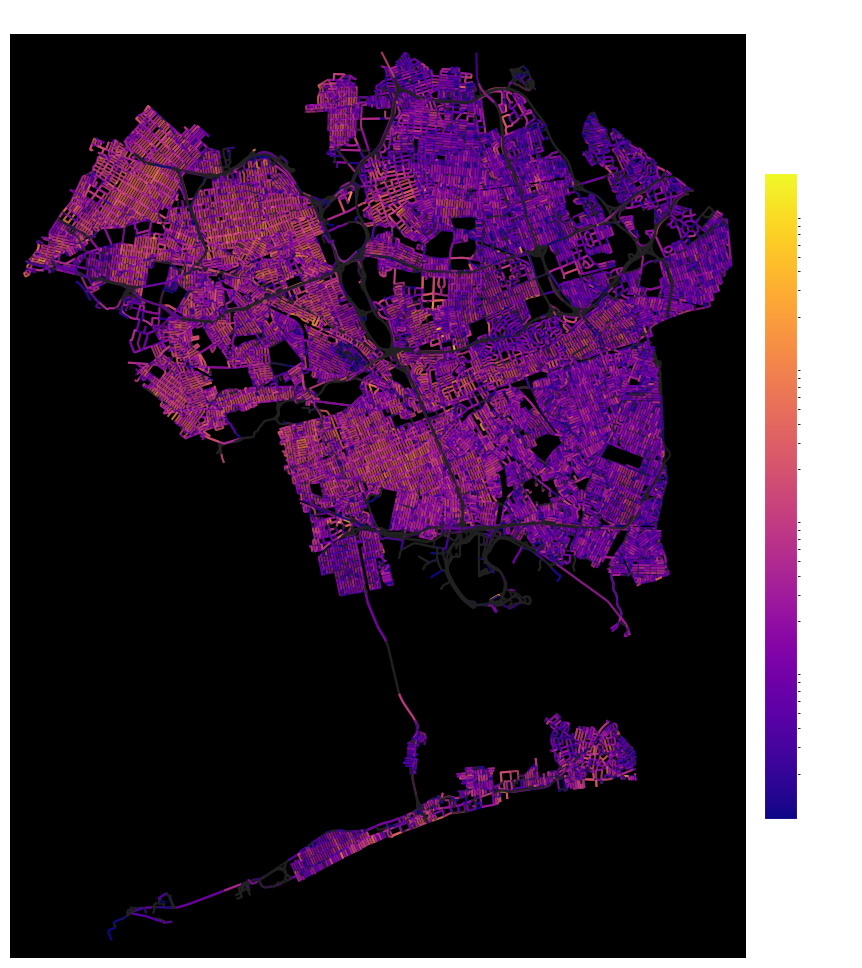

In [9]:
borough_name = "Queens"
G_queens, _ = generate_borough(df_merged_reduced, borough_name)
plot_borough(G_queens, borough_name)

# 2. Borough by Month

✅ Graph downloaded successfully!


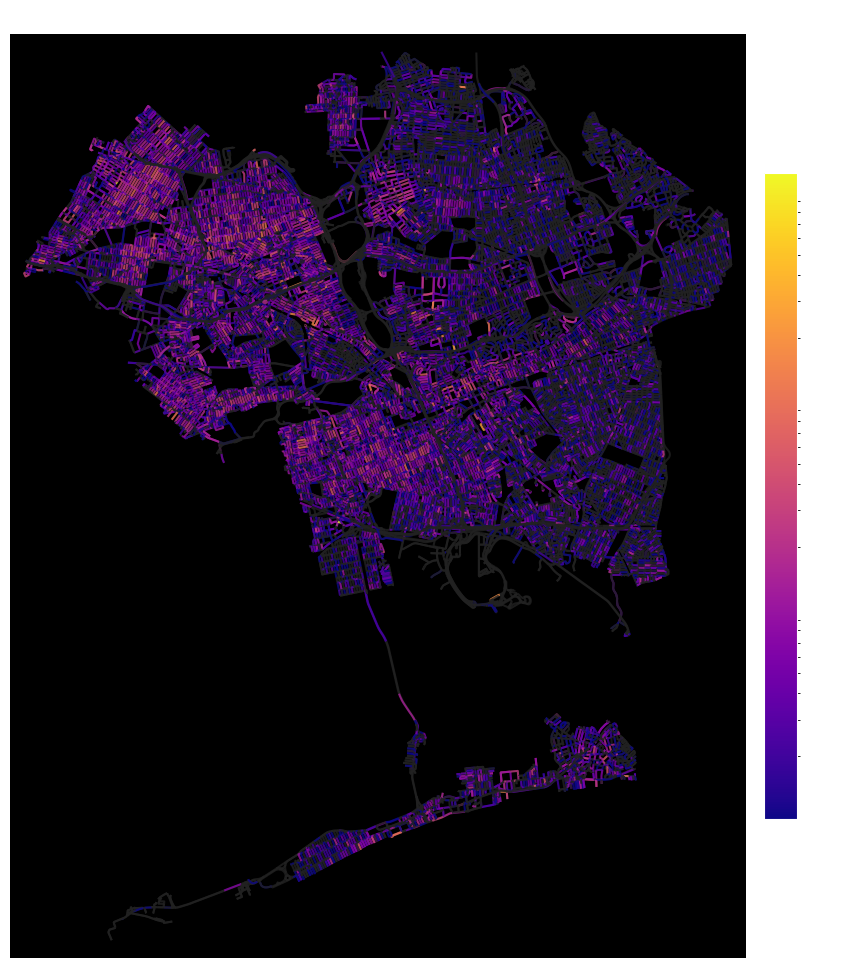

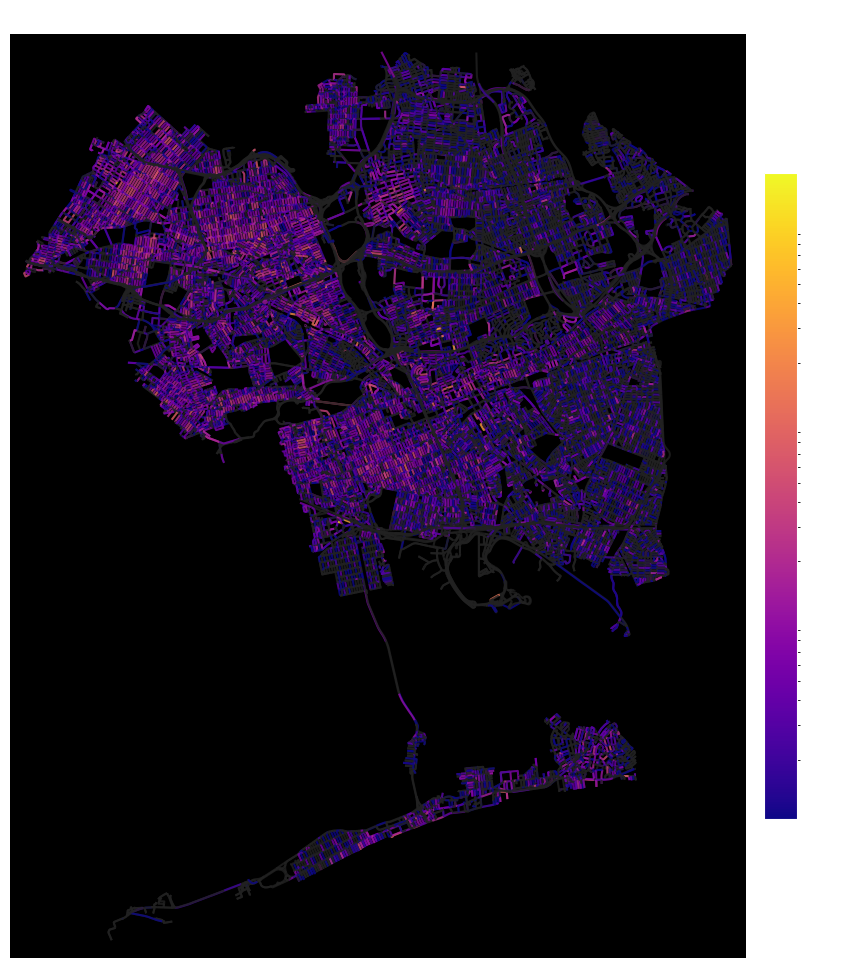

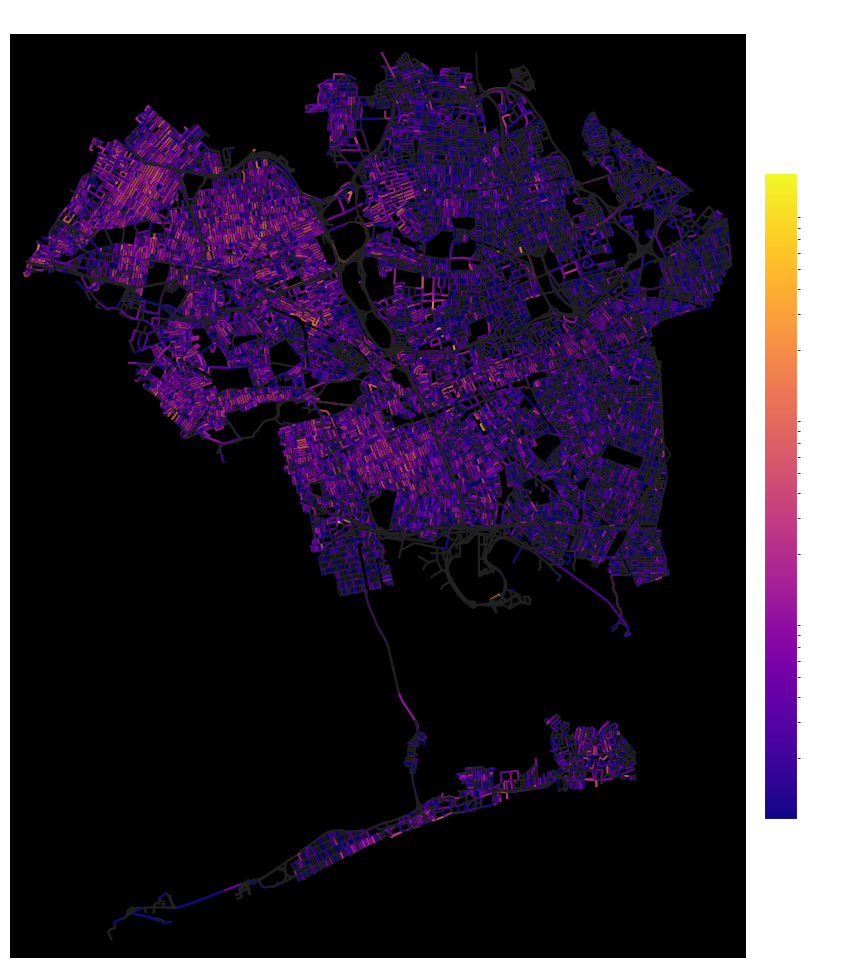

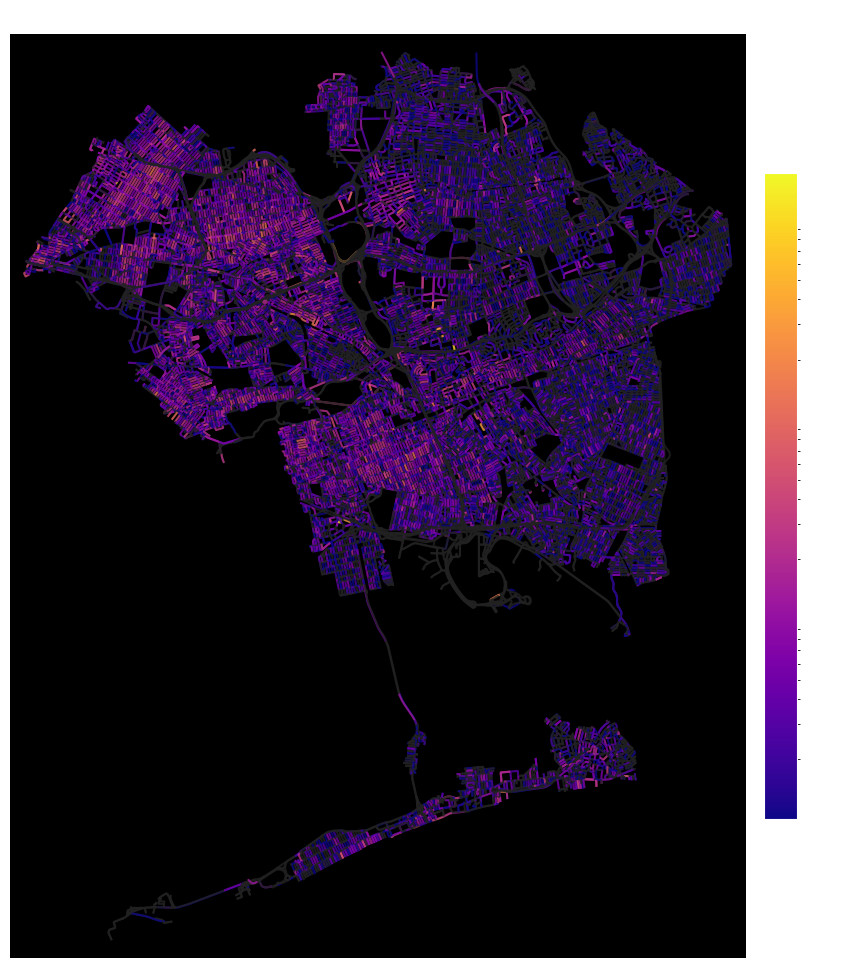

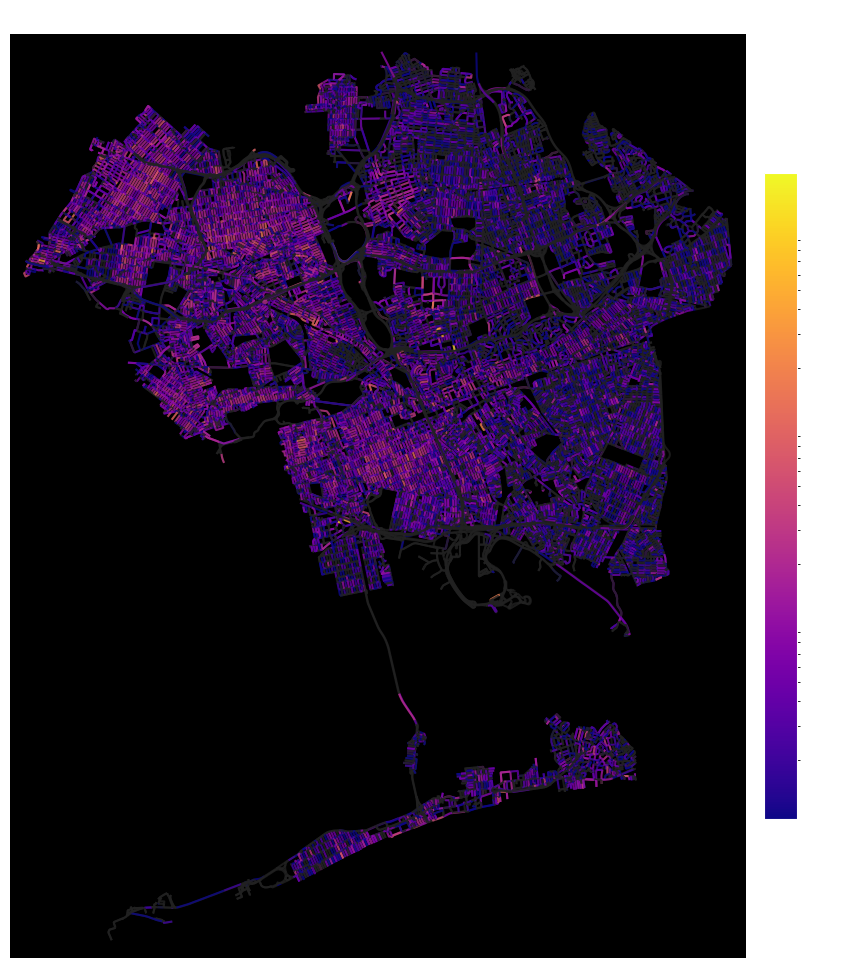

...

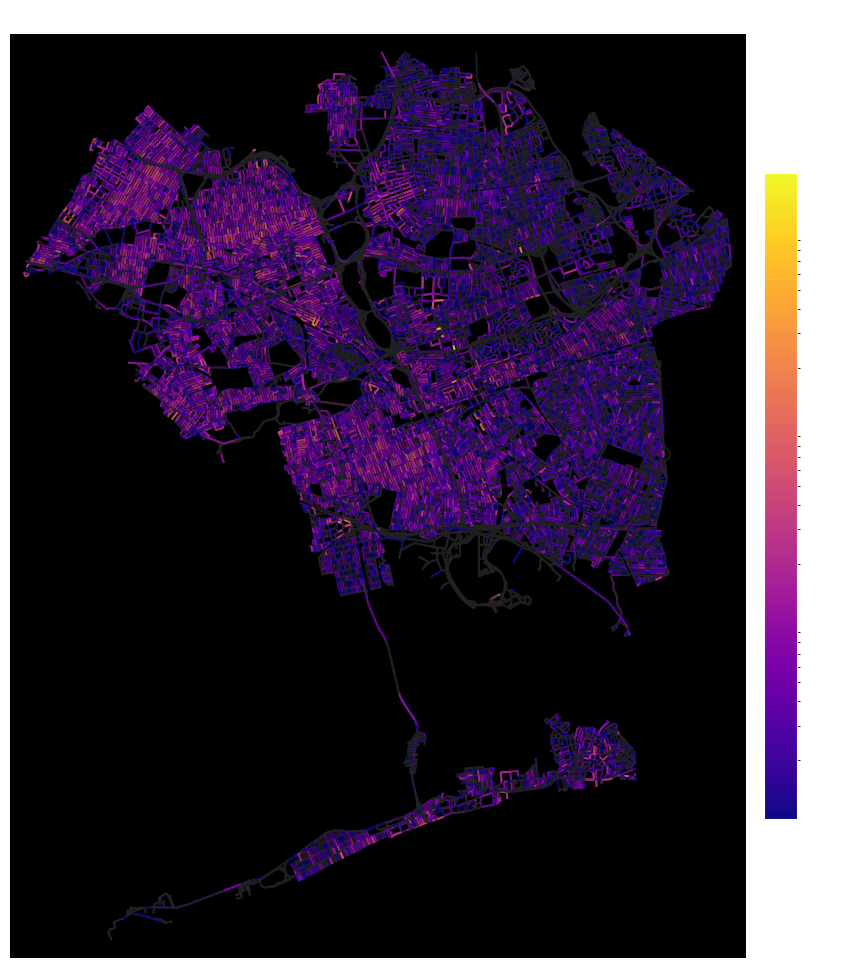

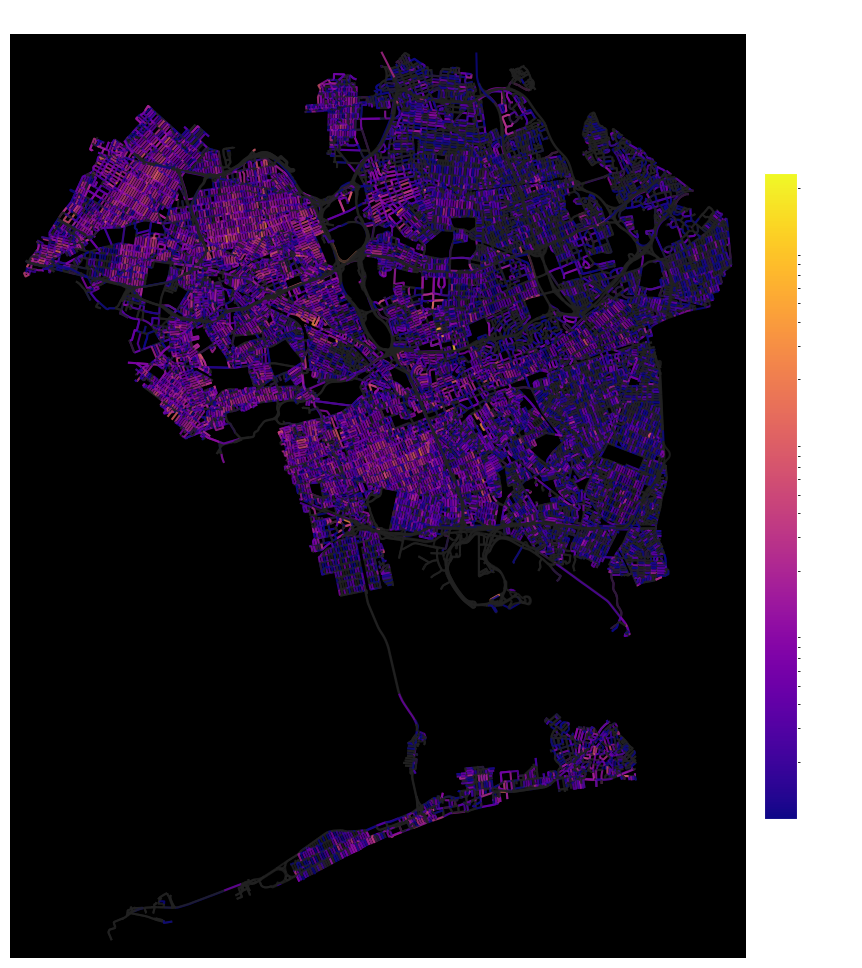

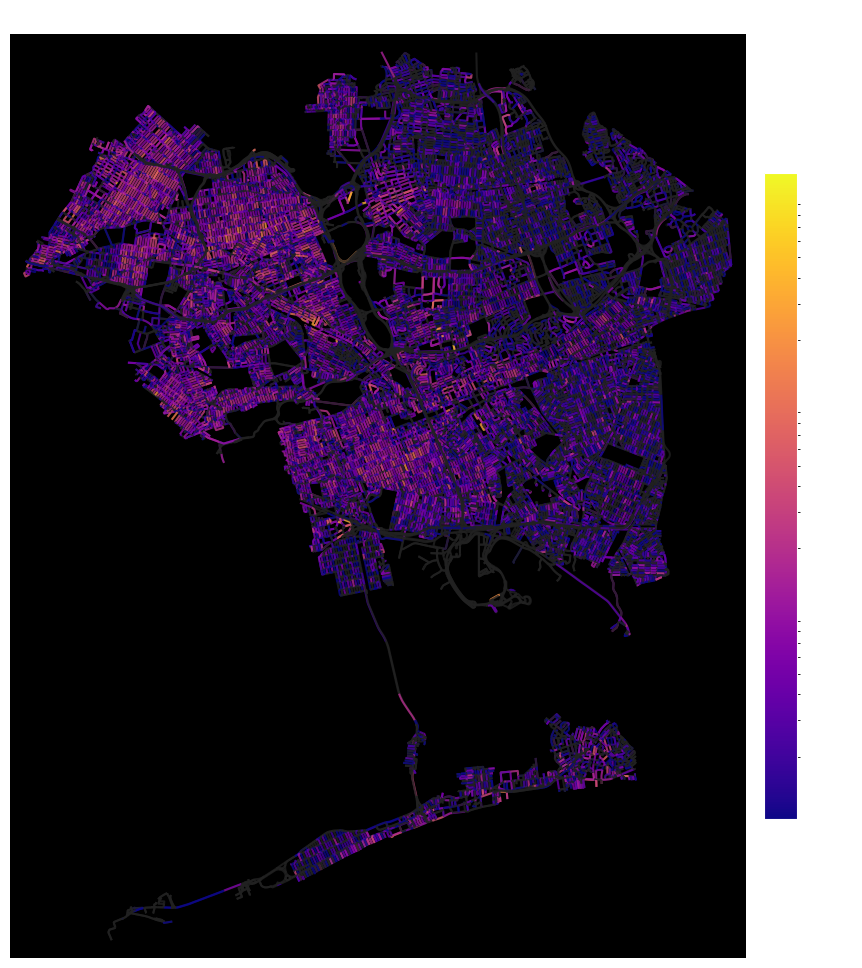

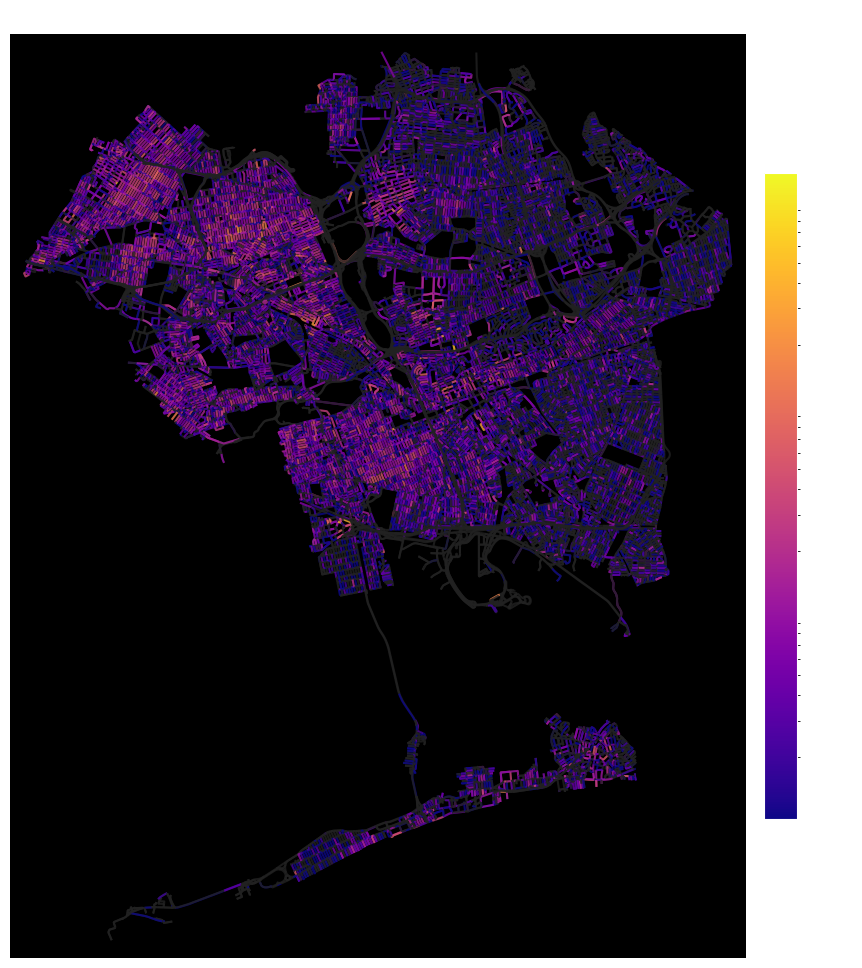

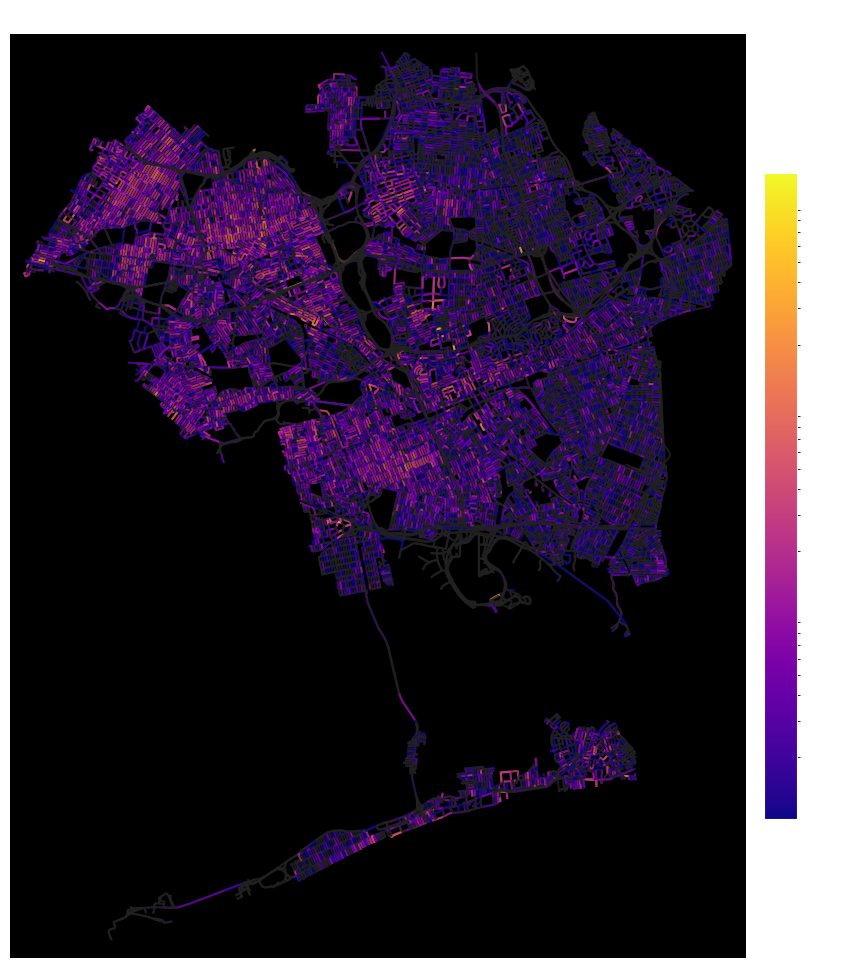

In [10]:
borough_name = "Queens" 
G = None
for month in range(1,13):
  filtered = df_merged_reduced[df_merged_reduced["month"] == month].copy()
  G_borough, G = generate_borough(filtered, borough_name, G)
  plot_borough(G_borough, borough_name, month)

# 3. Network features in modeling

In [11]:
df_merged_reduced_queens = df_merged_reduced[df_merged_reduced["borough"] == "QUEENS"].copy()


In [12]:
df_merged_reduced_brookyln = df_merged_reduced[df_merged_reduced["borough"] == "BROOKLYN"].copy()


In [13]:
df_merged_reduced_bronx = df_merged_reduced[df_merged_reduced["borough"] == "BRONX"].copy()


In [14]:
df_merged_reduced_staten = df_merged_reduced[df_merged_reduced["borough"] == "STATEN ISLAND"].copy()


In [15]:
df_merged_reduced_unspecified = df_merged_reduced[df_merged_reduced["borough"] == "Unspecified"].copy()

## 3.1 Creating graph of borough

In [16]:
borough_name = "Queens"

In [17]:

place_name = f"{borough_name.title()}, New York City, New York, USA"

try:
  # Simplify=True cleans up complex intersections which helps with analysis
  G = ox.graph_from_place(place_name, network_type='drive', simplify=True)
  print("✅ Graph downloaded successfully!")
except Exception as e:
  print(f"❌ Error downloading graph: {e}")
  # Fallback for complex names (sometimes 'Brooklyn' needs 'Kings County')
  print("Try hardcoding specific place names if this fails.")

✅ Graph downloaded successfully!


## 3.2 Get betweenness centrality and degree

In [18]:
betweenness = nx.betweenness_centrality(G, k=100)

def get_graph_features(row):
    # Find nearest node to the complaint
    nearest_node = ox.distance.nearest_nodes(G, row['longitude'], row['latitude'])
    
    # Extract metrics for that node
    node_centrality = betweenness.get(nearest_node, 0)
    node_degree = G.degree[nearest_node]
    
    return pd.Series([node_centrality, node_degree])

In [ ]:
df_merged_reduced_queens['nearest_node'] = ox.distance.nearest_nodes(G, X=df_merged_reduced_queens['longitude'], Y=df_merged_reduced_queens['latitude'])


In [20]:
node_betweenness = nx.betweenness_centrality(G, k=2000, normalized=True)
node_degree = dict(G.degree())

graph_features = pd.DataFrame({
    'node_id': list(G.nodes()),
    'intersection_betweenness': [node_betweenness.get(n, 0) for n in G.nodes()],
    'intersection_complexity': [node_degree.get(n, 0) for n in G.nodes()]
})

In [21]:
df_queens_betweenness = df_merged_reduced_queens.merge(graph_features, left_on='nearest_node', right_on='node_id', how='left')


## 3.3 Random Forest

In [24]:
le = LabelEncoder()
df_queens_betweenness['borough_encoded'] = le.fit_transform(df_queens_betweenness['borough'].astype(str))
df_queens_betweenness['location_type_encoded'] = le.fit_transform(df_queens_betweenness['location_type'].astype(str))

In [25]:
features = [
  "month",
  "day_of_week",
  "hour",
  "latitude",
  "longitude",
  "location_type_encoded",
  # "incident_zip", 
  "tavg",
  "prcp",
  "snow",
  "intersection_betweenness",
  "intersection_complexity"
]

y = df_queens_betweenness.complaint_type
X = df_queens_betweenness[features]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [26]:
rf = RandomForestClassifier(n_estimators=50, random_state=42, max_depth=15, min_samples_leaf=10, n_jobs=2)
rf.fit(X_train, y_train)

predictions = rf.predict(X_test)
print(classification_report(y_test, predictions))

                                precision    recall  f1-score   support

             Abandoned Vehicle       0.85      0.02      0.04     16226
                   Air Quality       0.80      0.45      0.57      1776
                  Animal-Abuse       1.00      0.01      0.01      1319
                     Appliance       0.00      0.00      0.00      1658
              Blocked Driveway       0.64      0.15      0.25     42293
                  Building/Use       0.36      0.28      0.31      5610
            Consumer Complaint       0.81      0.97      0.88      2858
                Curb Condition       1.00      0.01      0.02      1108
                  Damaged Tree       0.26      0.38      0.31      6962
                   Dead Animal       0.00      0.00      0.00      1910
               Dead/Dying Tree       0.86      0.00      0.00      3023
             Derelict Vehicles       0.26      0.67      0.37      8844
               Dirty Condition       0.43      0.60      0.50  

In [27]:
importances = rf.feature_importances_
feature_imp_df = pd.DataFrame({'Feature': features, 'Gini Importance': importances}).sort_values(
    'Gini Importance', ascending=False)
print(feature_imp_df)

                     Feature  Gini Importance
5      location_type_encoded         0.633874
4                  longitude         0.093678
3                   latitude         0.092853
2                       hour         0.050208
9   intersection_betweenness         0.047200
6                       tavg         0.025282
10   intersection_complexity         0.021574
1                day_of_week         0.014534
0                      month         0.012539
7                       prcp         0.007595
8                       snow         0.000663
